# Computer Vision 2023 Assignment 1: Image filtering.

In this prac you will research, implement and test some image filtering operations. Image filtering by convolution is a fundamental step in many computer vision tasks and you will find it useful to have a firm grasp of how it works. For example, later in the course we will come across Convolutional Neural Networks (CNNs) which are built from convolutional image filters.

The main aims of the prac are:

- to understand the basics of how images are stored and processed in memory;
- to gain exposure to several common image filters, and understand how they work;
- to get practical experience implementing convolutional image filters;
- to test your intuition about image filtering by running some experiments;
- to report your results in a clear and concise manner.

*This assignment relates to the following ACS CBOK areas: abstraction, design, hardware and software, data and information, HCI and programming.*

## General instructions

Follow the instructions in this Python notebook and the accompanying file *a1code.py* to answer each question. It's your responsibility to make sure your answer to each question is clearly labelled and easy to understand. Note that most questions require some combination of Python code, graphical output, and text analysing or describing your results. Although we will check your code as needed, marks will be assigned based on the quality of your write up rather than for code correctness! This is not a programming test - we are more interested in your understanding of the topic.

Only a small amount of code is required to answer each question. We will make extensive use of the Python libraries

- [numpy](numpy.org) for mathematical functions
- [skimage](https://scikit-image.org) for image loading and processing
- [matplotlib](https://matplotlib.org/stable/index.html) for displaying graphical results
- [jupyter](https://jupyter.org) for Jupyter Notebooks

You should get familiar with the documentation for these libraries so that you can use them effectively.

# The Questions

To get started, below is some setup code to import the libraries we need. You should not need to edit it.

In [1]:
# Numpy is the main package for scientific computing with Python. 
import numpy as np

#from skimage import io

# Imports all the methods we define in the file a1code.py
from a1code import *

# Matplotlib is a useful plotting library for python 
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

## Question 0: Numpy warm up! (5%)

Before starting the assignment, make sure you have a working Python 3 installation, with up to date versions of the libraries mentioned above. If this is all new to you, I'd suggest  downloading an all in one Python installation such as [Anaconda](https://www.anaconda.com/products/individual). Alternatively you can use a Python package manager such as pip or conda, to get the libraries you need. If you're struggling with this please ask a question on the MyUni discussion forum.

For this assignment, you need some familiarity with numpy syntax. The numpy QuickStart should be enough to get you started:

https://numpy.org/doc/stable/user/quickstart.html

Here are a few warm up exercises to make sure you understand the basics. Answer them in the space below. Be sure to print the output of each question so we can see it!

1. Create a 1D numpy array Z with 12 elements. Fill with values 1 to 12.
2. Reshape Z into a 2D numpy array A with 3 rows and 4 columns.
3. Reshape Z into a 2D numpy array B with 4 rows and 3 columns.
4. Calculate the *matrix* product of A and B.
5. Calculate the *element wise* product of $A$ and $B^T$ (B transpose).


In [2]:
import numpy as np
#Create a 1D numpy array Z with 12 elements. Fill with values 1 to 12.
Z = np.arange(1,13)
print("This is Z\n", Z)

#Reshape Z into a 2D numpy array A with 3 rows and 4 columns.
A = np.reshape(Z, (3,4))
print("\nThis is A\n", A)

#Reshape Z into a 2D numpy array B with 4 rows and 3 columns.
B = np.reshape(Z, (4,3))
print("\nThis is B\n", B)

#Calculate the matrix product of A and B.
print("\nThis is matrix product of A and B\n", A@B)

#Calculate the element wise product of 𝐴 and 𝐵𝑇 (B transpose).
Bt = np.transpose(B, axes=None)
print("\nThis is elementwise product of A and BT\n", Bt*A)

This is Z
 [ 1  2  3  4  5  6  7  8  9 10 11 12]

This is A
 [[ 1  2  3  4]
 [ 5  6  7  8]
 [ 9 10 11 12]]

This is B
 [[ 1  2  3]
 [ 4  5  6]
 [ 7  8  9]
 [10 11 12]]

This is matrix product of A and B
 [[ 70  80  90]
 [158 184 210]
 [246 288 330]]

This is elementwise product of A and BT
 [[  1   8  21  40]
 [ 10  30  56  88]
 [ 27  60  99 144]]


You need to be comfortable with numpy arrays because that is how we store images. Let's do that next!

## Question 1: Loading and displaying an image (10%)

Below is a function to display an image using the pyplot module in matplotlib. Implement the `load()` and `print_stats()` functions in a1code.py so that the following code loads the mandrill image, displays it and prints its height, width and channel. 

In [3]:
def display(img, caption=''):
    # Show image using pyplot 
    plt.figure()
    plt.imshow(img)
    plt.title(caption)
    plt.axis('off')
    plt.show()

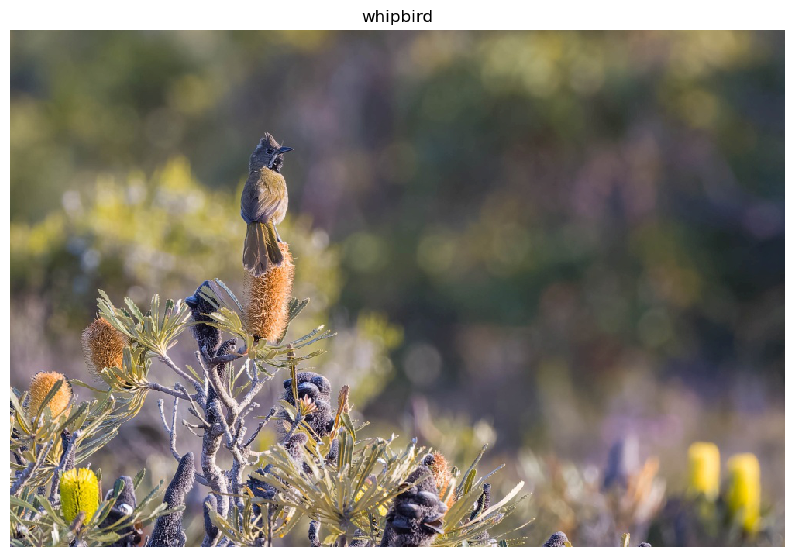

Image height:  667
Image width:  1000
Number of channels:  3


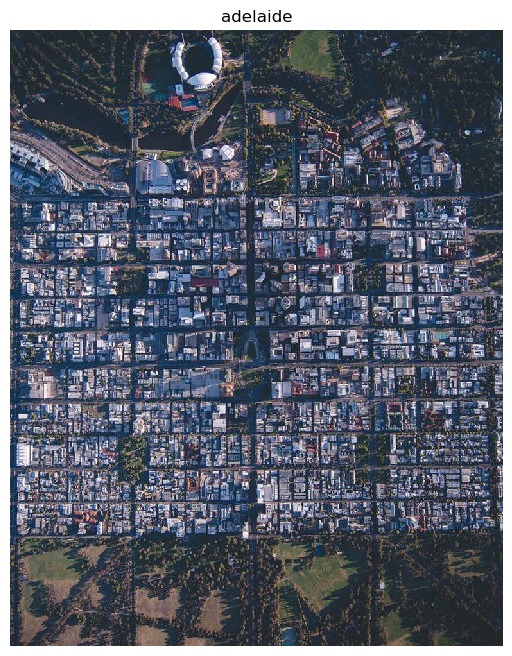

Image height:  960
Image width:  768
Number of channels:  3


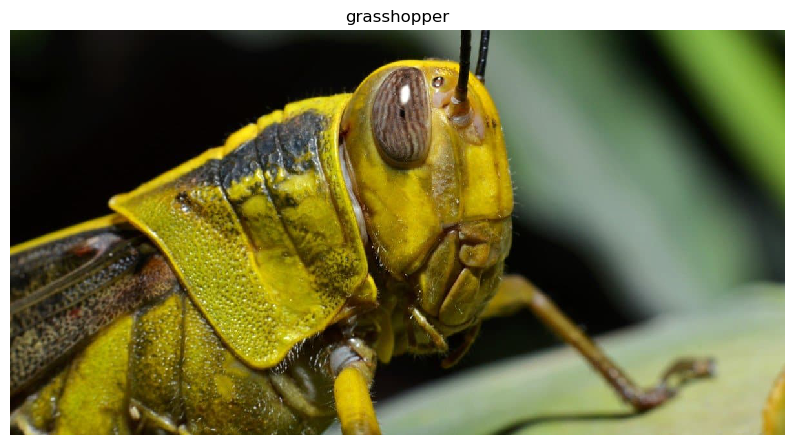

Image height:  627
Image width:  1200
Number of channels:  3


In [4]:
image1 = load('images/whipbird.jpg')
display(image1, 'whipbird')
print_stats(image1)

image2 = load('images/adelaide.jpg')
display(image2, 'adelaide')
print_stats(image2)

image3 = load('images/Grasshopper-close-up.jpg')
display(image3, 'grasshopper')
print_stats(image3)

Return to this question after reading through the rest of the assignment. Find 2 more images to use as test cases in this assignment for all the following questions and display them below. Use your print_stats() function to display their height, width and number of channels. Explain *why* you have chosen each image.

In [5]:
### Your code to load and display your images here
import numpy as np
from skimage import io
def load(img_path):
    #Convert image path into nupty array 'image'
    image = np.asarray(io.imread(img_path))
    
    #Convert all pixel values to a range between 0.0 and 1.0
    range = np.array([1/255])
    
    #Sets output 'out' to the array of the shape
    out = range*image
    
    return out

def print_stats(image):
    #Set variables
    image_height, image_width, n_channels = image.shape
    
    #Print the stats
    print("Image height: ", image_height)
    print("Image width: ", image_width)
    print("Number of channels: ", n_channels)
    
    return None

I chose the image of Adelaide because there are lots of horizontal and vertical lines, as well as dark and light contrasts, which will be interesting when filtering.

I chose the image of the grasshopper because there are also edges, but they are not exactly horizontal or vertical. There is also a sharp contrast between the dark background and the light grasshopper, will be good for binary() function.

## Question 2: Image processing (25%)

Now that you have an image stored as a numpy array, let's try some operations on it.

1. Implement the `crop()` function in a1code.py. Use array slicing to crop the image.
2. Implement the `resize()` function in a1code.py.
3. Implement the `change_contrast()` function in a1code.py.
4. Implement the `greyscale()` function in a1code.py.
5. Implement the `binary()` function in a1code.py.

What do you observe when you change the threshold of the binary function?

Apply all these functions with different parameters on your own test images.

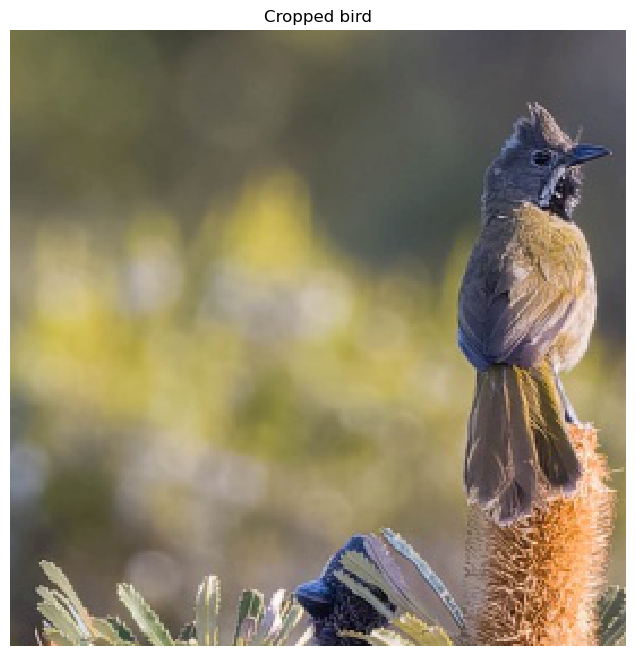

Image height:  272
Image width:  272
Number of channels:  3


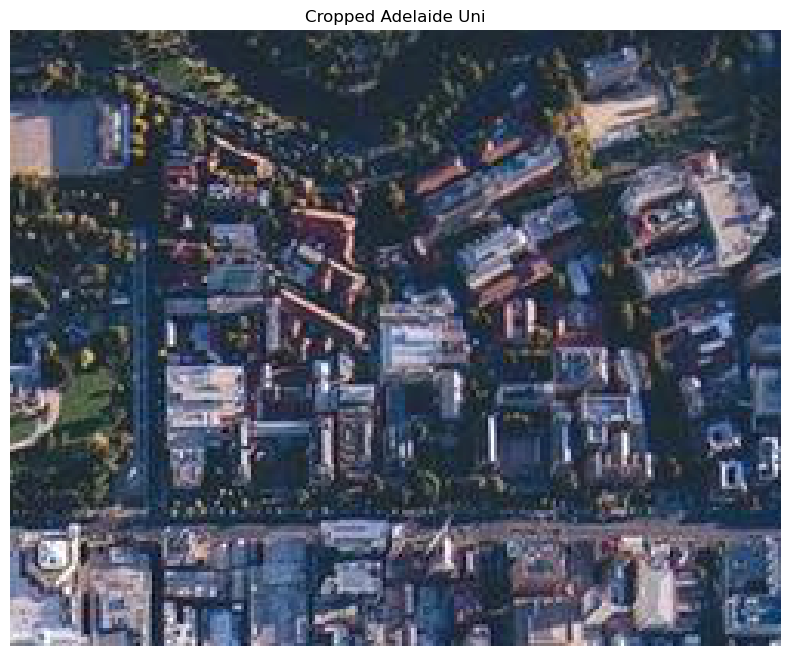

Image height:  200
Image width:  250
Number of channels:  3


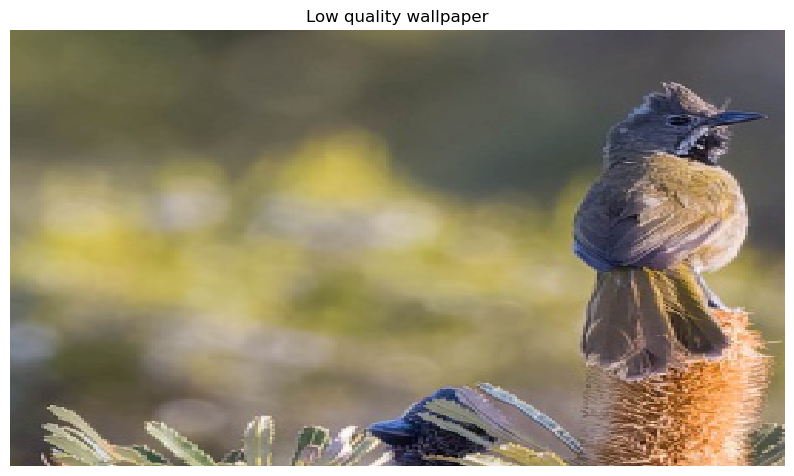

Image height:  1080
Image width:  1920
Number of channels:  3


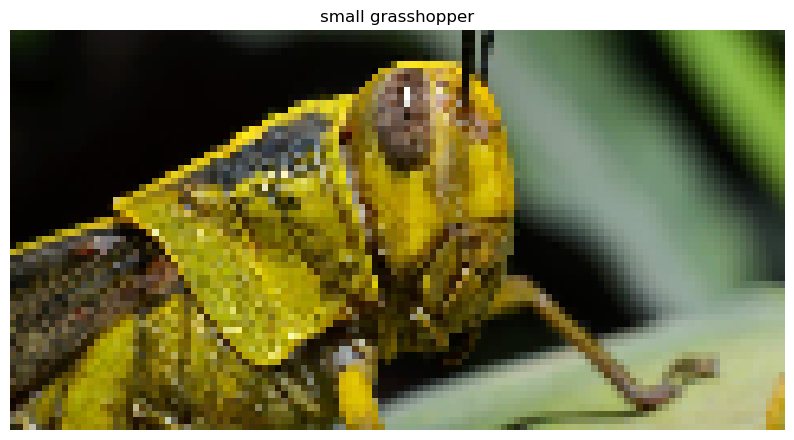

Image height:  62
Image width:  120
Number of channels:  3


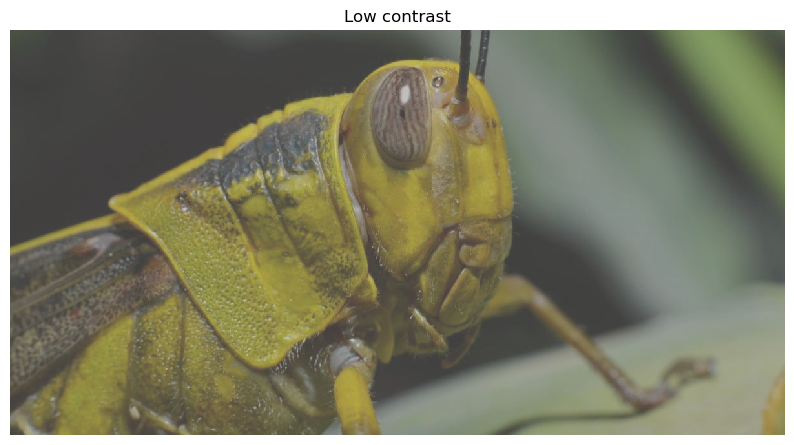

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image height:  627
Image width:  1200
Number of channels:  3


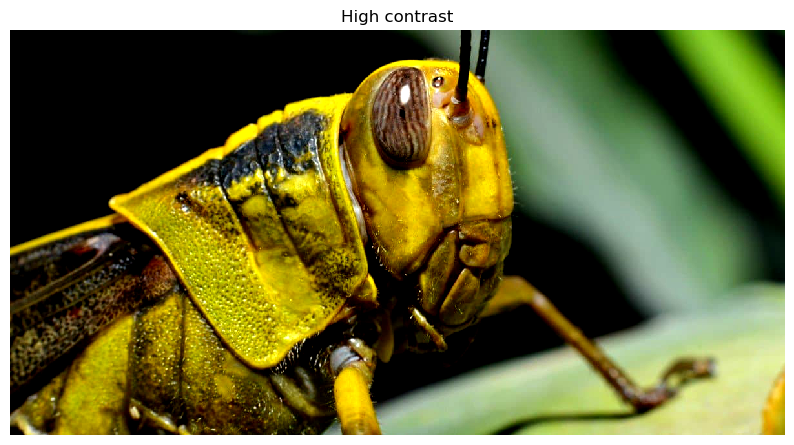

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image height:  627
Image width:  1200
Number of channels:  3


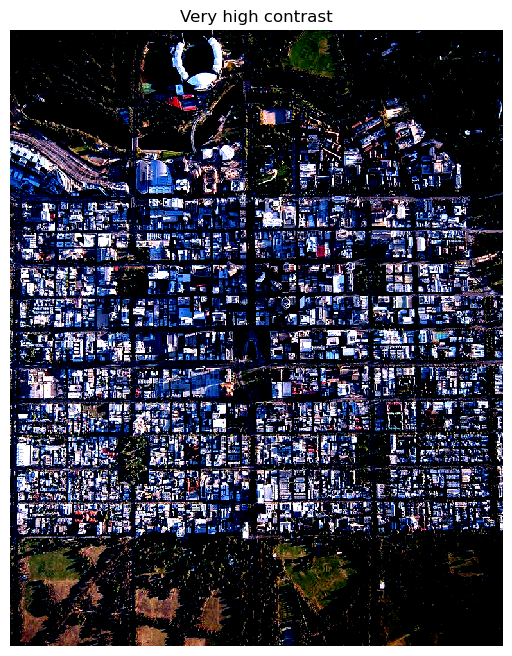

Image height:  960
Image width:  768
Number of channels:  3


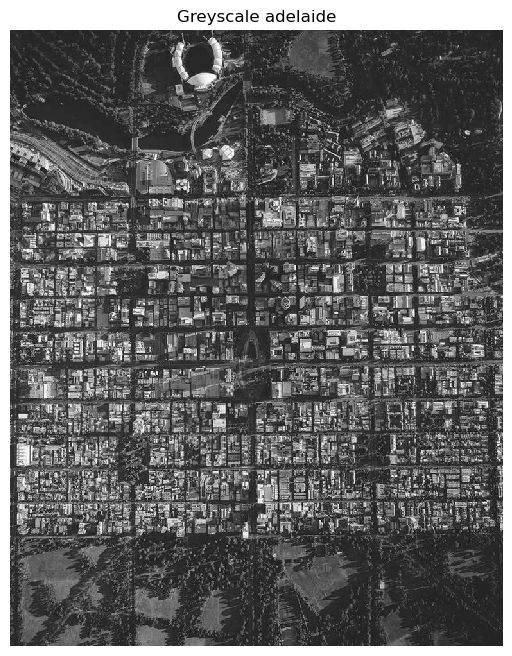

Image height:  960
Image width:  768
Number of channels:  1


NameError: name 'grey_img2' is not defined

In [6]:
# This should crop the bird from the  image; you will need to adjust the parameters for the correct crop size and location 
crop_img = crop(image1, 100, 100, 272, 272)
display(crop_img, "Cropped bird") 
print_stats(crop_img)

crop_img2 = crop(image2, 100, 400, 200, 250)
display(crop_img2, "Cropped Adelaide Uni") 
print_stats(crop_img2)

resize_img = resize(crop_img, 1080, 1920)
display(resize_img, "Low quality wallpaper")
print_stats(resize_img)

resize_img2 = resize(image3, 62, 120)
display(resize_img2, "small grasshopper")
print_stats(resize_img2)

contrast_img = change_contrast(image3, 0.5)
display(contrast_img, "Low contrast")
print_stats(contrast_img)

contrast_img2 = change_contrast(image3, 1.5)
display(contrast_img2, "High contrast")
print_stats(contrast_img2)

contrast_img3 = change_contrast(image2, 2.5)
display(contrast_img3, "Very high contrast")
print_stats(contrast_img3)

grey_img = greyscale(image2)
display(grey_img, "Greyscale adelaide")
print_stats(grey_img)

binary_img = binary(grey_img2, 0.3)
display(binary_img, "0.3 Tolerance")
print_stats(binary_img)
print("0.3 being a low tolerance, can see the silhouette of the grasshopper and the background \n")

binary_img = binary(grey_img2, 0.5)
display(binary_img, "0.6 Tolerance")
print_stats(binary_img)
print("0.6 being a high tolerance, almost lost the grasshopper, only can see the brightest parts of him\n")

binary_img = binary(grey_img2, 0.9)
display(binary_img, "0.9 Tolerance")
print_stats(binary_img)
print("0.9 is quite a high tolerance, only glimmers of the brightest pixels come through \n")


## Question 3: Convolution (25%)

### 3.1 2D convolution

Using the definition of 2D convolution from week 1, implement the convolution operation in the function `conv2D()` in a1code.py.


In [70]:
test_conv2D()

expected_output
 [[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 1. 2. 1. 1. 0. 0.]
 [0. 0. 1. 1. 2. 1. 1. 0. 0.]
 [0. 0. 2. 2. 3. 1. 1. 0. 0.]
 [0. 0. 1. 1. 1. 0. 0. 0. 0.]
 [0. 0. 1. 1. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]]
test_output
 [[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 1. 2. 1. 1. 0. 0.]
 [0. 0. 1. 1. 2. 1. 1. 0. 0.]
 [0. 0. 2. 2. 3. 1. 1. 0. 0.]
 [0. 0. 1. 1. 1. 0. 0. 0. 0.]
 [0. 0. 1. 1. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]]


# 3.2 RGB convolution

In the function `conv` in a1code.py, extend your function `conv2D` to work on RGB images, by applying the 2D convolution to each channel independently. 

### 3.3 Gaussian filter convolution

Use the `gauss2D` function provided in a1code.py to create a Gaussian kernel, and apply it to your images with convolution. You will obtain marks for trying different tests and analysing the results, for example:

- try varying the image size, and the size and variance of the filter  
- subtract the filtered image from the original - this gives you an idea of what information is lost when filtering

What do you observe and why?

### 3.4 Sobel filters

Define a horizontal and vertical Sobel edge filter kernel and test them on your images. You will obtain marks for testing them and displaying results in interesting ways, for example:

- apply them to an image at different scales
- considering how to display positive and negative gradients
- apply different combinations of horizontal and vertical filters

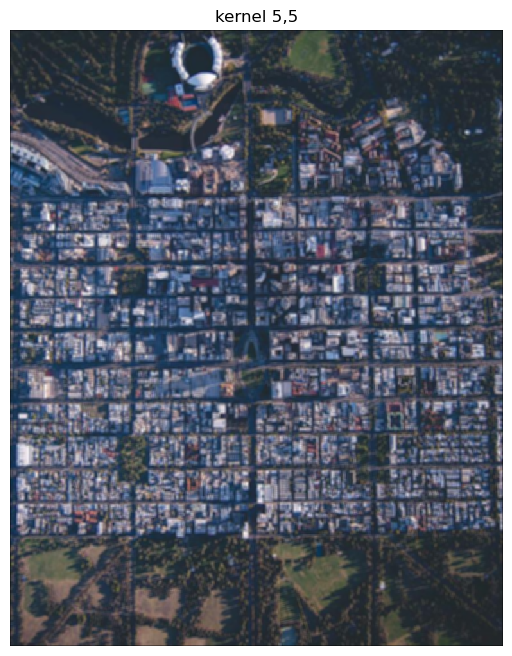

Baseline 



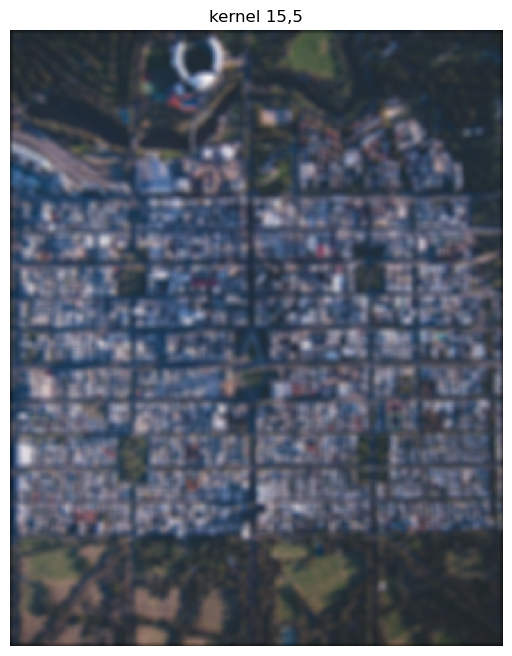

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Increased size, more blur. 



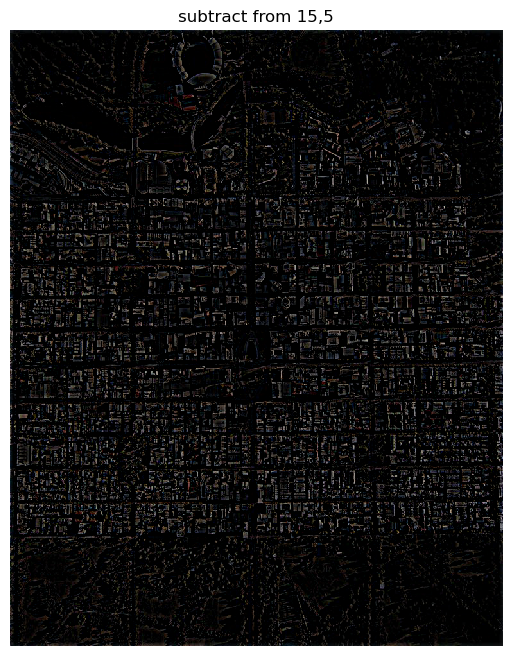

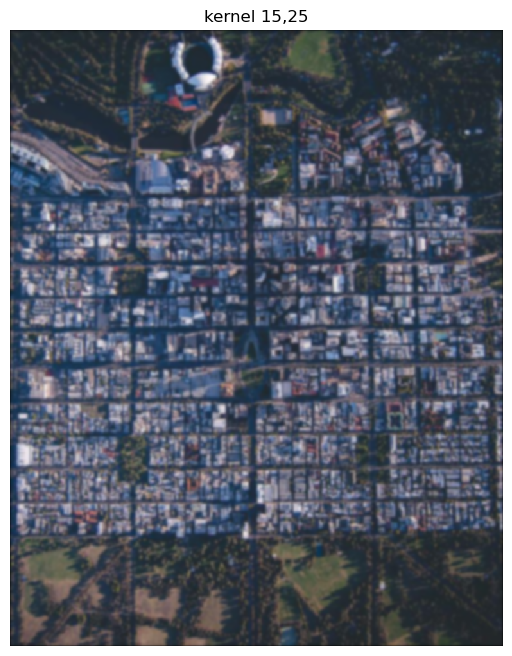

Same size, less blur. 



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


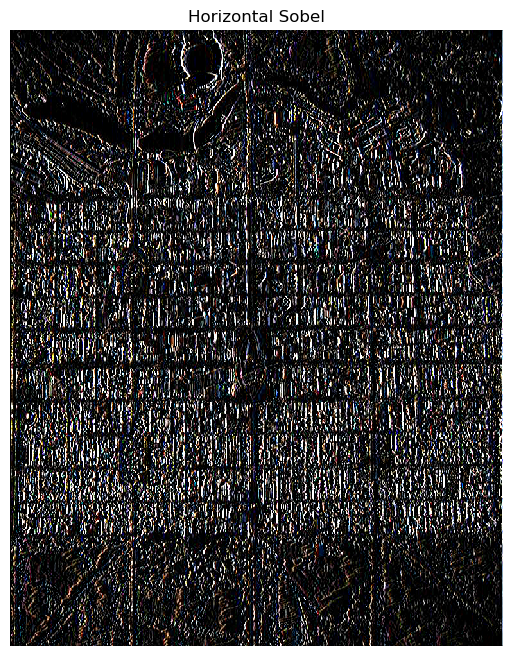

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


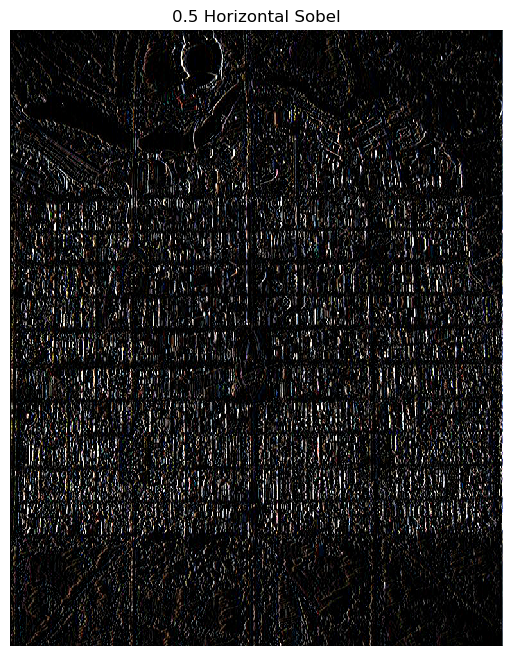

Less intense Horizontal sobel. Finds less vertical lines. 



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


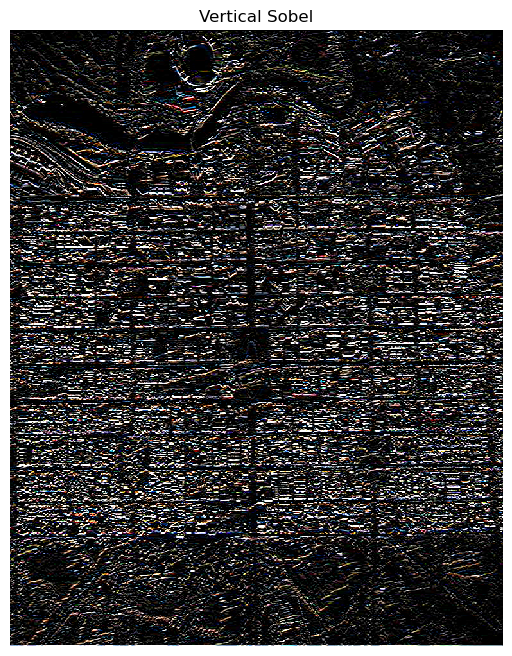

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


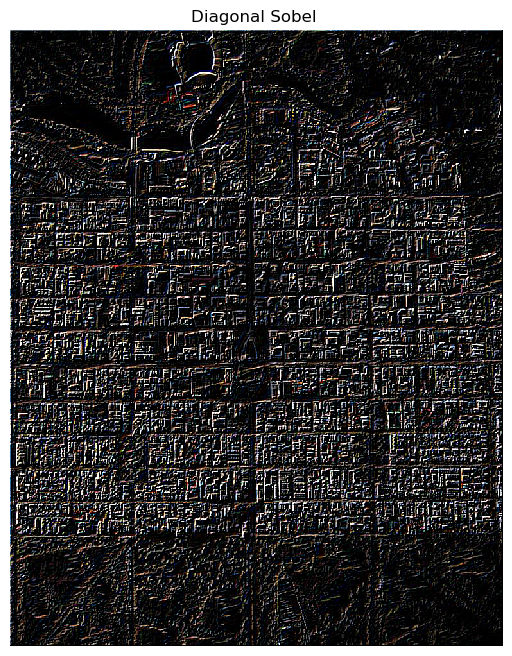

Diagonal sobel. It is like there was a light in the top left of the image, shining on the buildings. 



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


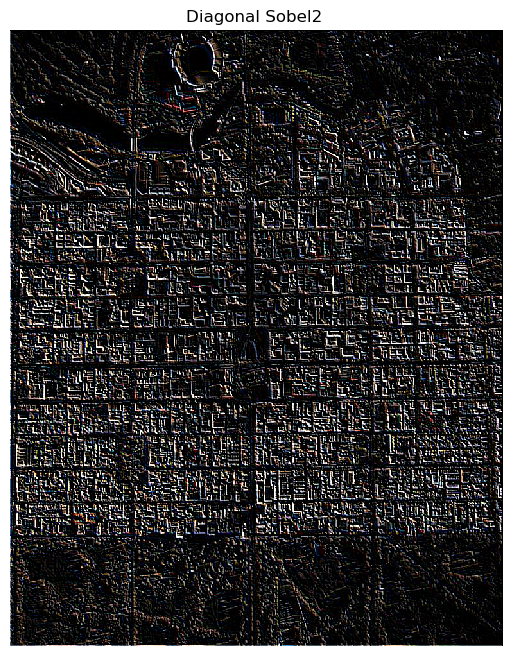

Opposite diagon to above. React strongly to top left to bottom right diagonals. If you compare this one and the one before at the tram line going west out of the city (Just below the top left corner) this is most obvious.



In [7]:
kernel = gauss2D(5, 5)
gauss1 = conv(image2, kernel)
display(gauss1, "kernel 5,5")
print("Baseline \n")

kernel = gauss2D(15, 5)
gauss2 = conv(image2, kernel)
display(gauss2, "kernel 15,5")
print("Increased size, more blur. \n")

display(image2-gauss2, "subtract from 15,5")

kernel = gauss2D(15, 2)
gauss3 = conv(image2, kernel)
display(gauss3, "kernel 15,25")
print("Same size, less blur. \n")

hSobel = np.array(
    [
        [1,0,-1],
        [2,0,-2],
        [1,0,-1]
    ])
vSobel = np.array(
    [
        [1,2,1],
        [0,0,0],
        [-1,-2,-1]
    ])
dSobel = np.array(
    [
        [-2,-1,0],
        [-1,0,1],
        [0,1,2]
    ])
dSobel2 = np.array(
    [
        [0,1,2],
        [-1,0,1],
        [-2,-1,0]
    ])

hSobelImage = conv(image2, hSobel)
display(hSobelImage, "Horizontal Sobel")

hSobelImage2 = conv(image2, 0.5*hSobel)
display(hSobelImage2, "0.5 Horizontal Sobel")
print("Less intense Horizontal sobel. Finds less vertical lines. \n")

vSobelImage = conv(image2, vSobel)
display(vSobelImage, "Vertical Sobel")

dSobelImage = conv(image2, 0.7*dSobel)
display(dSobelImage, "Diagonal Sobel ")
print("Diagonal sobel. It is like there was a light in the top left of the image, shining on the buildings. \n")

dSobelImage = conv(image2, 0.7*dSobel2)
display(dSobelImage, "Diagonal Sobel2 ")
print("Opposite diagon to above. React strongly to top left to bottom right diagonals. If you compare this one and the one before at the tram line going west out of the city (Just below the top left corner) this is most obvious.\n")

With the Gaussian filter convolution, I noticed that as the size or the theta increase, the intensity of the blur increases. The size applies the blur to a larger area and the omega changes the intensity of the blur. From removing the blurred image from the original, I observe that the gaussian blur reduces some pixels from the edges, emilinating bright spots. This would be because it runs it through a filter which detects those edges.

## Question 4: Image sampling and pyramids (35%)

### 4.1 Image Sampling

Apply your `resize()` function to reduce an image (I) to 0.5 height and width

Repeat the above procedure, but apply a Gaussian blur filter to your original image before downsampling it. How does the result compare to your previous output, and to the original image? Why?


### 4.2 Image Pyramids 
Creat a Gaussian pyramid as described in week2's lecture on an image.

Apply a Gaussian kernel to an image I, and resize it with ratio 0.5, to get $I_1$. Repeat this step to get $I_2$, $I_3$ and $I_4$.

Display these four images in a manner analogus to the example shown in the lectures.


Image height:  667
Image width:  1000
Number of channels:  3


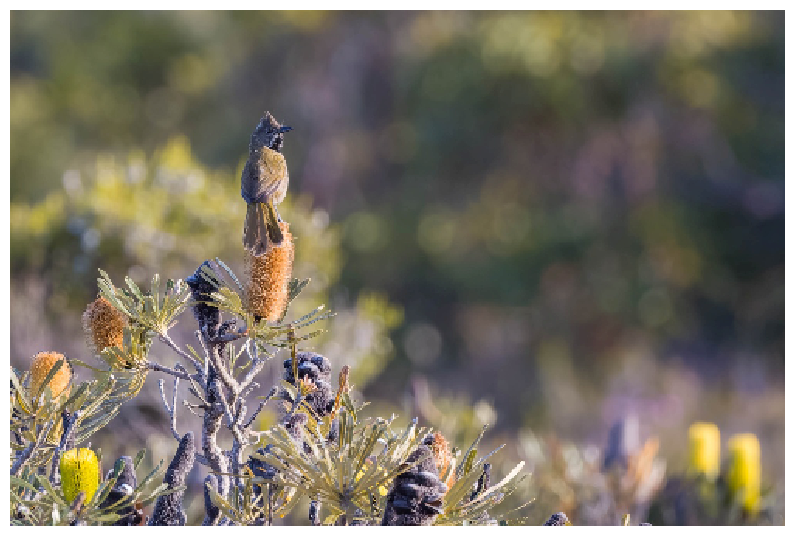

Image height:  333
Image width:  500
Number of channels:  3


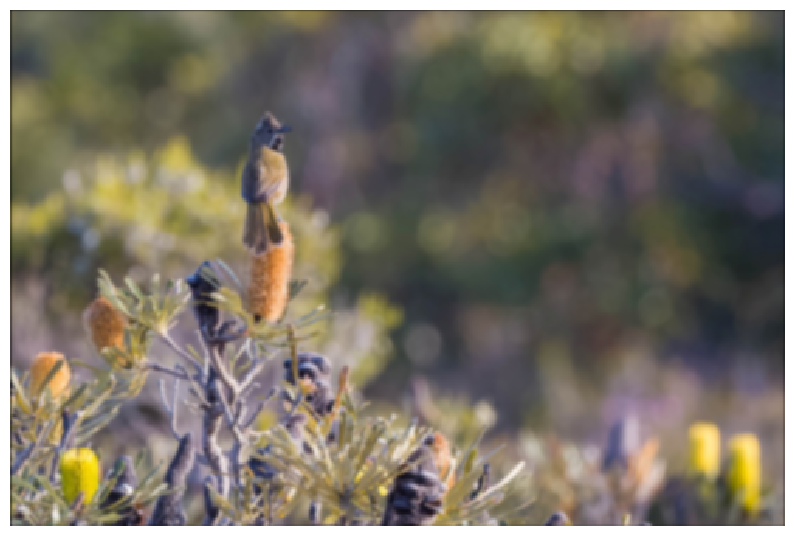

Image height:  333
Image width:  500
Number of channels:  3


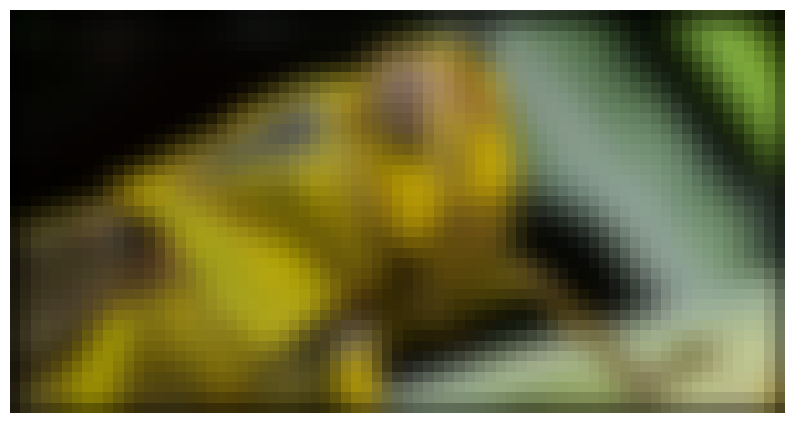

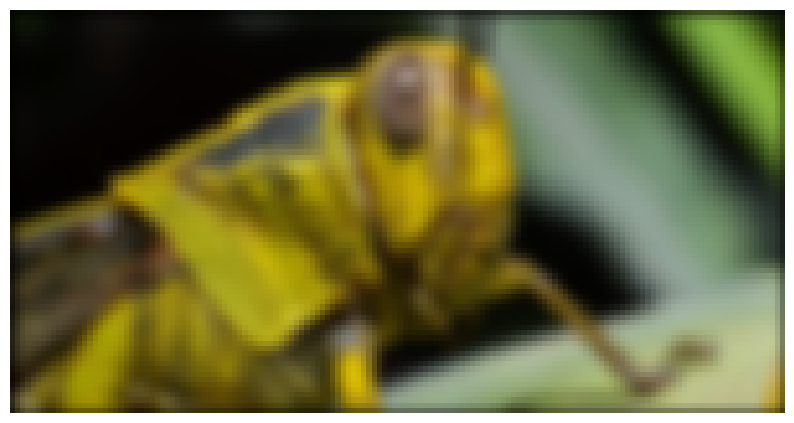

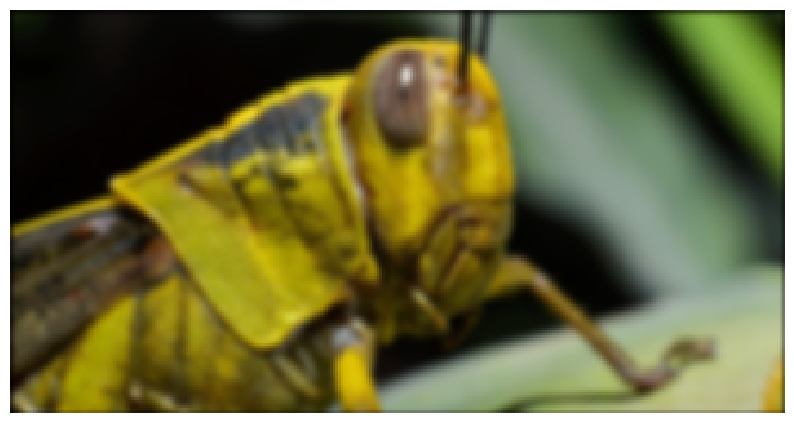

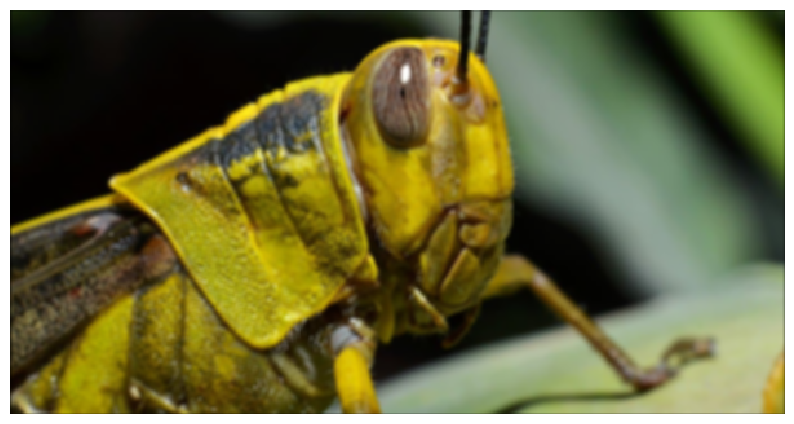

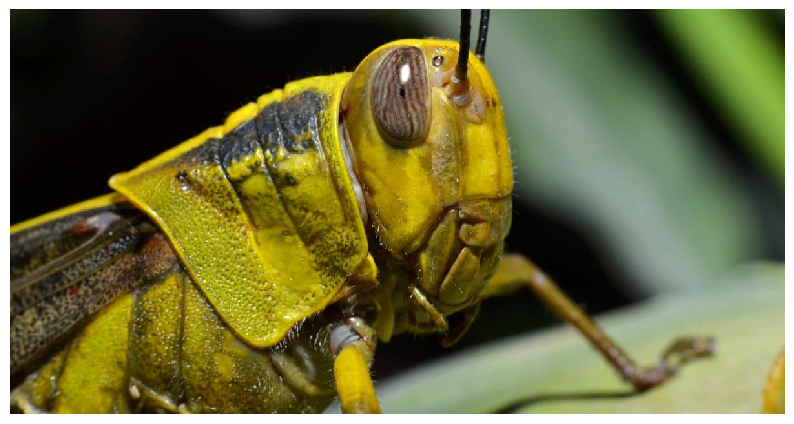

In [8]:
print_stats(image1)
resizeImage1 = resize(image1, 333, 500)
display(resizeImage1)
print_stats(resizeImage1)

gaussResizeImage1 = conv(image1, kernel)
gaussResizeImage1 = resize(gaussResizeImage1, 333, 500)
display(gaussResizeImage1)
print_stats(gaussResizeImage1)

kernel = gauss2D(9, 4)
I1 = conv(image3, kernel)
I1 = resize(I1, 313, 600)

I2 = conv(I1, kernel)
I2 = resize(I2, 156, 300)

I3 = conv(I2, kernel)
I3 = resize(I3, 78, 150)

I4 = conv(I3, kernel)
I4 = resize(I4, 39, 75)

display(I4)
display(I3)
display(I2)
display(I1)
display(image3)

The resized image leaves the image pixelated, and some details are lost. However, when a Gaussian blur filter is applied first, the details are smoothed out. The large uniform regions are preserved.

With the Gaussian pyramid, the comparison is analogus to the ones shown in the lecture in the fact that it goes from low quality to high, but instead of resizing the images they are the same size on the screen. You can see that the nature of the image is preserved effectively, withe the smallest image only being 39x75, but can still 'see' that it is a grasshopper.